# Petals to the Metal - Flower Classification on TPU
> Getting Started with TPUs on Kaggle!

- toc: true
- badges: true
- categories: [plant,classification,tpu]


# Dependencies

In [4]:
#collapse-hide
import numpy as np
import pandas as pd
import seaborn as sns
import albumentations as A
import matplotlib.pyplot as plt
import os, gc, cv2, random, warnings, math, sys, json, pprint, pdb

import tensorflow as tf
from tensorflow.keras import backend as K
import tensorflow_hub as hub

from sklearn.model_selection import train_test_split

# Setup

In [32]:
#@title Accelerator type { run: "auto" }
DEVICE = 'TPU' #@param ["None", "'GPU'", "'TPU'"] {type:"raw", allow-input: true}

if DEVICE == "TPU":
    print("connecting to TPU...")
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('Running on TPU ', tpu.master())
    except ValueError:
        print("Could not connect to TPU")
        tpu = None

    if tpu:
        try:
            print("initializing  TPU ...")
            tf.config.experimental_connect_to_cluster(tpu)
            tf.tpu.experimental.initialize_tpu_system(tpu)
            strategy = tf.distribute.experimental.TPUStrategy(tpu)
            print("TPU initialized")
        except _:
            print("failed to initialize TPU")
    else:
        DEVICE = "GPU"

if DEVICE != "TPU":
    print("Using default strategy for CPU and single GPU")
    strategy = tf.distribute.get_strategy()

if DEVICE == "GPU":
    print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
    

AUTOTUNE = tf.data.experimental.AUTOTUNE
REPLICAS = strategy.num_replicas_in_sync
print(f'REPLICAS: {REPLICAS}')

connecting to TPU...
Could not connect to TPU
Using default strategy for CPU and single GPU
Num GPUs Available:  0
REPLICAS: 1


In [33]:
def seed_everything(seed=0):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'

def is_colab():
    return 'google.colab' in str(get_ipython())

> Tip: Adding seed helps reproduce results. Setting debug parameter wil run the model on smaller number of epochs to validate the architecture.

In [34]:
#hide_input
#@title Debugger { run: "auto" }
SEED = 16
DEBUG = True #@param {type:"boolean"}
TRAIN = True #@param {type:"boolean"}
INFERENCE = True #@param {type:"boolean"}

IS_COLAB = is_colab()

warnings.simplefilter('ignore')
seed_everything(SEED)

print(f"Using TensorFlow v{tf.__version__}")

Using TensorFlow v2.4.0


In [35]:
#hide
if IS_COLAB:
    from google.colab import drive
    drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [36]:
GCS_PATTERN = 'gs://flowers-public/*/*.jpg'
GCS_OUTPUT = 'gs://flowers-public/tfrecords-jpeg-192x192-2/flowers'
SHARDS = 16
TARGET_SIZE = [192, 192]
CLASSES = [b'daisy', b'dandelion', b'roses', b'sunflowers', b'tulips']

In [37]:
project_name = 'tpu-getting-started'
root_path  = '/content/gdrive/MyDrive/' if IS_COLAB else '/'
input_path = f'{root_path}kaggle/input/{project_name}/'
working_path = f'{input_path}working/' if IS_COLAB else '/kaggle/working/'
os.makedirs(working_path, exist_ok=True)
os.chdir(working_path)
os.listdir(input_path)

['working']

# Loading data

## Read images and labels

In [40]:
def decode_image_and_label(filename):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits)
    label = tf.strings.split(tf.expand_dims(filename, axis=-1), sep='/')
    #label = tf.strings.split(filename, sep='/')
    label = label.values[-2]
    return image, label

In [41]:
 filenames = tf.data.Dataset.list_files(GCS_PATTERN, seed=16)

In [42]:
for x in filenames.take(10): print(x)

tf.Tensor(b'gs://flowers-public/tulips/251811158_75fa3034ff.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/daisy/506348009_9ecff8b6ef.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/daisy/2019064575_7656b9340f_m.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/tulips/8713396140_5af8136136.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/roses/218630974_5646dafc63_m.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/roses/410421672_563550467c.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/tulips/8614237582_74417799f4_m.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/dandelion/8797114213_103535743c_m.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/dandelion/11296320473_1d9261ddcb.jpg', shape=(), dtype=string)
tf.Tensor(b'gs://flowers-public/dandelion/14554897292_b3e30e52f2.jpg', shape=(), dtype=string)


In [43]:
ds0 = filenames.map(decode_image_and_label, num_parallel_calls=AUTOTUNE)

In [44]:
def show_images(ds):
    _,axs = plt.subplots(3,3,figsize=(16,16))
    for ((x, y), ax) in zip(ds.take(9), axs.flatten()):
        ax.imshow(x.numpy().astype(np.uint8))
        ax.set_title(y.numpy().decode("utf-8"))
        ax.axis('off')

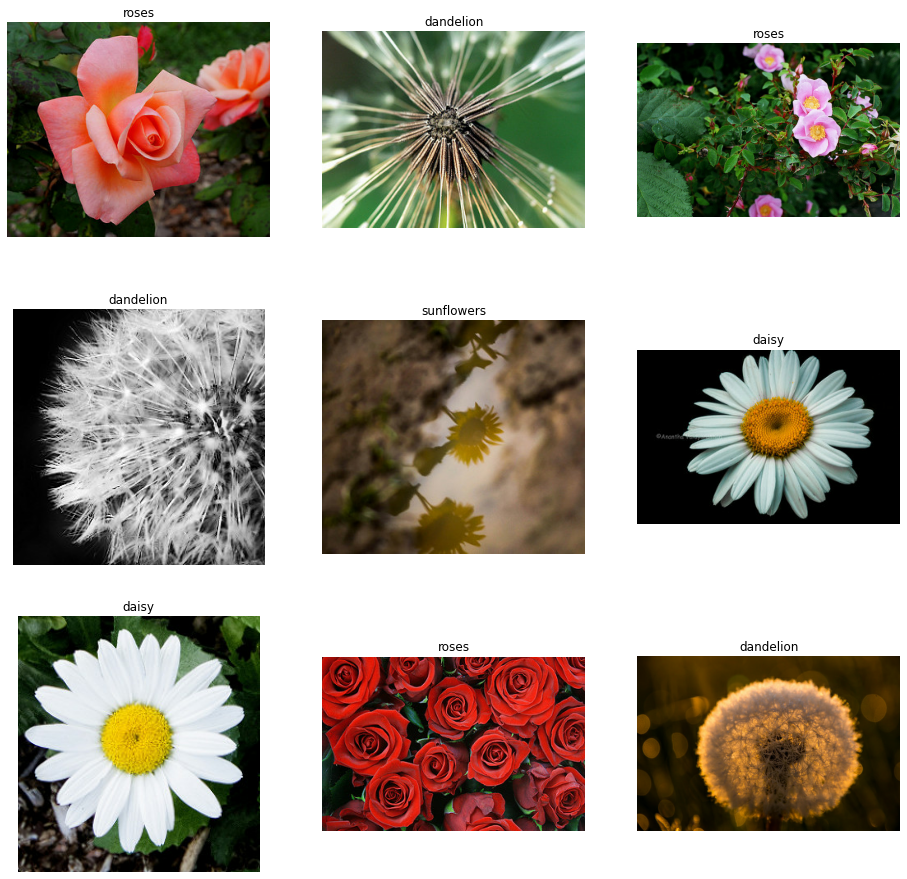

In [45]:
 show_images(ds0)

## Resize and crop images to common size

No need to study the code in this cell. It's only image resizing.




In [27]:
def resize_and_crop_image(image, label):
    # Resize and crop using "fill" algorithm:
    # always make sure the resulting image
    # is cut out from the source image so that
    # it fills the TARGET_SIZE entirely with no
    # black bars and a preserved aspect ratio.
    w = tf.shape(image)[0]
    h = tf.shape(image)[1]
    tw = TARGET_SIZE[1]
    th = TARGET_SIZE[0]
    resize_crit = (w * th) / (h * tw)
    image = tf.cond(resize_crit < 1,
                    lambda: tf.image.resize(image, [w*tw/w, h*tw/w]), # if true
                    lambda: tf.image.resize(image, [w*th/h, h*th/h])  # if false
                   )
    nw = tf.shape(image)[0]
    nh = tf.shape(image)[1]
    image = tf.image.crop_to_bounding_box(image, (nw - tw) // 2, (nh - th) // 2, tw, th)
    return image, label

In [29]:
ds1 = ds0.map(resize_and_crop_image, num_parallel_calls=AUTOTUNE) 

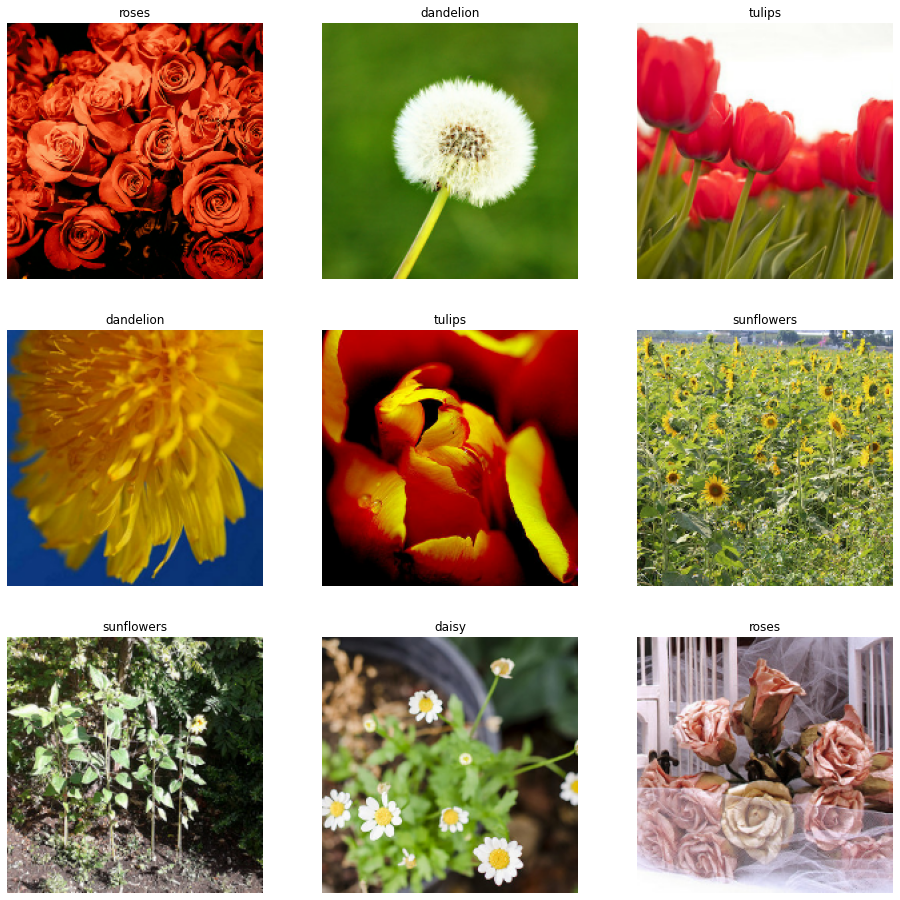

In [30]:
show_images(ds1)

## Speed test: too slow

Google Cloud Storage is capable of great throughput but has a per-file access penalty. Run the cell below and see that throughput is around 8 images per second. That is too slow. Training on thousands of individual files will not work. We have to use the *TFRecord* format to group files together.

In [31]:
for image,label in ds1.batch(8).take(30):
    print("Image batch shape {} {}".format(
        image.numpy().shape,
        [lbl.decode('utf8') for lbl in label.numpy()]))

Image batch shape (8, 192, 192, 3) ['dandelion', 'tulips', 'daisy', 'dandelion', 'roses', 'tulips', 'dandelion', 'tulips']
Image batch shape (8, 192, 192, 3) ['roses', 'roses', 'daisy', 'tulips', 'roses', 'dandelion', 'dandelion', 'tulips']
Image batch shape (8, 192, 192, 3) ['sunflowers', 'tulips', 'sunflowers', 'daisy', 'dandelion', 'dandelion', 'daisy', 'sunflowers']
Image batch shape (8, 192, 192, 3) ['tulips', 'sunflowers', 'tulips', 'dandelion', 'tulips', 'tulips', 'roses', 'sunflowers']
Image batch shape (8, 192, 192, 3) ['dandelion', 'sunflowers', 'dandelion', 'tulips', 'tulips', 'tulips', 'daisy', 'tulips']
Image batch shape (8, 192, 192, 3) ['tulips', 'roses', 'daisy', 'sunflowers', 'dandelion', 'tulips', 'daisy', 'roses']
Image batch shape (8, 192, 192, 3) ['sunflowers', 'sunflowers', 'sunflowers', 'daisy', 'tulips', 'sunflowers', 'daisy', 'roses']
Image batch shape (8, 192, 192, 3) ['dandelion', 'dandelion', 'tulips', 'dandelion', 'daisy', 'dandelion', 'roses', 'sunflowers'

## Recompress the images

The bandwidth savings outweight the decoding CPU cost

In [46]:
def recompress_image(image, label):
    height = tf.shape(image)[0]
    width = tf.shape(image)[1]
    image = tf.cast(image, tf.uint8)
    image = tf.image.encode_jpeg(image, optimize_size=True, chroma_downsampling=False)
    return image, label, height, width

In [53]:
IMAGE_SIZE = len(tf.io.gfile.glob(GCS_PATTERN))
SHARD_SIZE = math.ceil(1.0 * IMAGE_SIZE / SHARDS)

In [56]:
ds2 = ds1.map(recompress_image, num_parallel_calls=AUTOTUNE)
ds2 = ds2.batch(SHARD_SIZE) # sharding: there will be one "batch" of images per file

## Write dataset to TFRecord files

## Read from TFRecord Dataset

# 1% Better Everyday

**reference**
- [Flower pictures to TFRecords.ipynb](https://colab.research.google.com/github/GoogleCloudPlatform/training-data-analyst/blob/master/courses/fast-and-lean-data-science/03_Flower_pictures_to_TFRecords.ipynb#scrollTo=MPkvHdAYNt9J)
- [TFRecords Basics
](https://www.kaggle.com/ryanholbrook/tfrecords-basics)
- [Create Your First Submission
](https://www.kaggle.com/ryanholbrook/create-your-first-submission)
- [How to use my own data source?
](https://www.kaggle.com/c/flower-classification-with-tpus/discussion/130326)
- [TPU-speed data pipelines: tf.data.Dataset and TFRecords
](https://codelabs.developers.google.com/codelabs/keras-flowers-data/#5)
---
**todos**

---
**done**


## Configuration

In [ ]:
#@title {run: "auto" }

BASE_MODEL, IMG_SIZE = ('efficientnet_b3', 300) #@param ["('efficientnet_b3', 300)", "('efficientnet_b4', 380)", "('efficientnet_b2', 260)"] {type:"raw", allow-input: true}
BATCH_SIZE = 32 #@param {type:"integer"}
IMG_SIZE = (IMG_SIZE, IMG_SIZE) #@param ["(IMG_SIZE, IMG_SIZE)", "(512,512)"] {type:"raw"}
print("Using {} with input size {}".format(BASE_MODEL, IMG_SIZE))

Using efficientnet_b3 with input size (300, 300)


## Loading data
After my quick and rough EDA, let's load the PIL Image to a Numpy array, so we can move on to data augmentation.

In fastai, they have `item_tfms` and `batch_tfms` defined for their data loader API. The item transforms performs a fairly large crop to 224 and also apply other standard augmentations (in aug_tranforms) at the batch level on the GPU. The batch size is set to 32 here.

### Splitting

### Constructing Dataset

In [ ]:
train_ds = tf.data.Dataset.from_tensor_slices(
    (train_df.filename.values,train_df.label.values))
valid_ds = tf.data.Dataset.from_tensor_slices(
    (valid_df.filename.values, valid_df.label.values))
adapt_ds = tf.data.Dataset.from_tensor_slices(
    train_df.filename.values)

In [ ]:
for x,y in valid_ds.take(3): print(x, y)

tf.Tensor(b'/content/gdrive/MyDrive/kaggle/input/cassava-leaf-disease-classification/train_images/2484271873.jpg', shape=(), dtype=string) tf.Tensor(4, shape=(), dtype=int64)
tf.Tensor(b'/content/gdrive/MyDrive/kaggle/input/cassava-leaf-disease-classification/train_images/3704210007.jpg', shape=(), dtype=string) tf.Tensor(4, shape=(), dtype=int64)
tf.Tensor(b'/content/gdrive/MyDrive/kaggle/input/cassava-leaf-disease-classification/train_images/1655615998.jpg', shape=(), dtype=string) tf.Tensor(2, shape=(), dtype=int64)


> Important: At this point, you may have noticed that I have not used any kind of normalization or rescaling. I recently discovered that there is Normalization layer included in Keras' pretrained EfficientNet, as mentioned [here](https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/#keras-implementation-of-efficientnet). 

### Item transformation

Basically item transformations mainly make sure the input data is of the same size so that it can be collated in batches.


In [ ]:
def decode_image(filename):
    img = tf.io.read_file(filename)
    img = tf.image.decode_jpeg(img, channels=3)
    return img
  
def collate_train(filename, label):
    img = decode_image(filename)
    img = tf.image.random_brightness(img, 0.3)
    img = tf.image.random_flip_left_right(img, seed=None)
    img = tf.image.random_crop(img, size=[*IMG_SIZE, 3])
    return img, label

def process_adapt(filename):
    img = decode_image(filename)
    img = tf.keras.layers.experimental.preprocessing.Rescaling(1.0 / 255)(img)
    return img

def collate_valid(filename, label):
    img = decode_image(filename)
    img = tf.image.resize(img, [*IMG_SIZE])
    return img, label

In [ ]:
train_ds = train_ds.map(collate_train, num_parallel_calls=AUTOTUNE)
valid_ds = valid_ds.map(collate_valid, num_parallel_calls=AUTOTUNE)
adapt_ds = adapt_ds.map(process_adapt, num_parallel_calls=AUTOTUNE)

In [ ]:
def show_images(ds):
    _,axs = plt.subplots(4,6,figsize=(24,16))
    for ((x, y), ax) in zip(ds.take(24), axs.flatten()):
        ax.imshow(x.numpy().astype(np.uint8))
        ax.set_title(np.argmax(y))
        ax.axis('off')

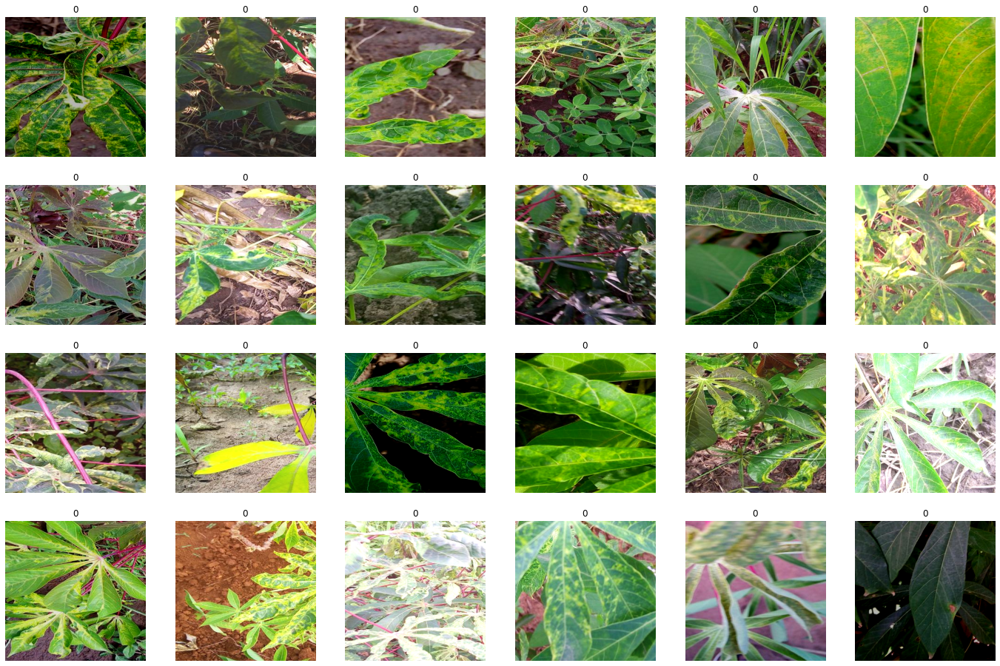

In [ ]:
show_images(train_ds)

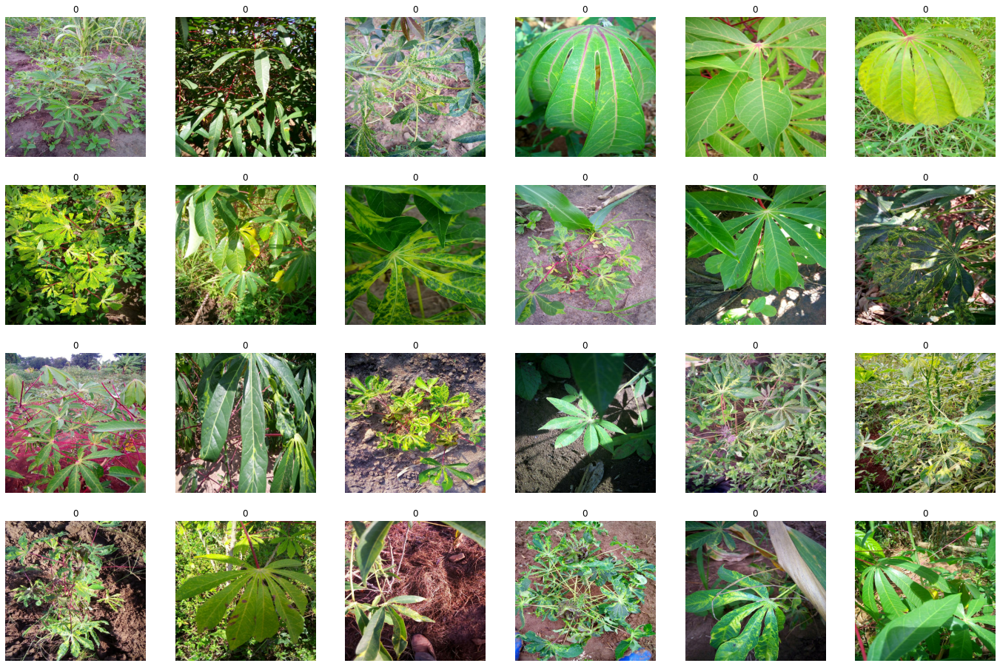

In [ ]:
show_images(valid_ds)

### Batching Dataset

> Note: I was shuffing the validation set which is a bug

In [ ]:
train_ds_batch = (train_ds
                  .cache('dump.tfcache')
                  .shuffle(buffer_size=1000)
                  .batch(BATCH_SIZE)
                  .prefetch(buffer_size=AUTOTUNE))

valid_ds_batch = (valid_ds
                  #.shuffle(buffer_size=1000)
                  .batch(BATCH_SIZE*2)
                  .prefetch(buffer_size=AUTOTUNE))

adapt_ds_batch = (adapt_ds
                  .shuffle(buffer_size=1000)
                  .batch(BATCH_SIZE)
                  .prefetch(buffer_size=AUTOTUNE))

## Batch augmentation

In [ ]:
data_augmentation = tf.keras.Sequential(
    [
     tf.keras.layers.experimental.preprocessing.RandomCrop(*IMG_SIZE),
     tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
     tf.keras.layers.experimental.preprocessing.RandomRotation(0.25),
     tf.keras.layers.experimental.preprocessing.RandomZoom((-0.2, 0)),
     tf.keras.layers.experimental.preprocessing.RandomContrast((0.2,0.2))
    ]
)

In [ ]:
func = lambda x,y: (data_augmentation(x), y)
x = (train_ds
     .batch(BATCH_SIZE)
     .take(1)
     .map(func, num_parallel_calls=AUTOTUNE))

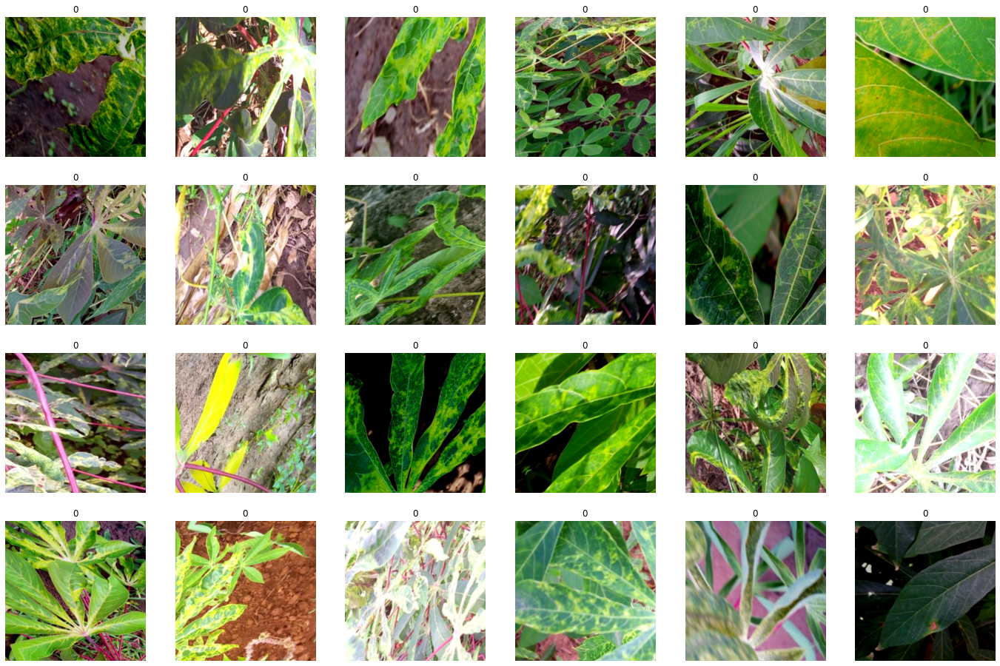

In [ ]:
show_images(x.unbatch())

## Building a model

I am using an EfficientNetB3 on top of which I add some output layers to predict our 5 disease classes. I decided to load the imagenet pretrained weights locally to keep the internet off (part of the requirements to submit a kernal to this competition).

In [ ]:
from tensorflow.keras.applications import EfficientNetB3

In [ ]:
efficientnet = EfficientNetB3(
    weights = 'imagenet' if TRAIN else None, 
    include_top = False, 
    input_shape = (*IMG_SIZE, 3), 
    pooling='avg')

In [ ]:
def build_model(base_model, num_class):
    inputs = tf.keras.layers.Input(shape=(*IMG_SIZE, 3))
    x = data_augmentation(inputs)
    x = base_model(x)
    x = tf.keras.layers.Dropout(0.4)(x)
    outputs = tf.keras.layers.Dense(num_class, activation="softmax", name="pred")(x)
    model = tf.keras.models.Model(inputs=inputs, outputs=outputs)
    return model

In [ ]:
model = build_model(base_model=efficientnet, num_class=len(id2label))

In [ ]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 300, 300, 3)]     0         
_________________________________________________________________
sequential_2 (Sequential)    (None, 300, 300, 3)       0         
_________________________________________________________________
efficientnetb3 (Functional)  (None, 1536)              10783535  
_________________________________________________________________
dropout_1 (Dropout)          (None, 1536)              0         
_________________________________________________________________
pred (Dense)                 (None, 5)                 7685      
Total params: 10,791,220
Trainable params: 10,703,917
Non-trainable params: 87,303
_________________________________________________________________


## Fine tune

The 3rd layer of the Efficient is the Normalization layer, which can be tuned to our new dataset instead of `imagenet`. Be patient on this one, it does take a bit of time as we're going through the entire training set.

In [ ]:
%%time
if TRAIN:
    if not os.path.exists(f"{working_path}000_normalization.h5"):
        model.get_layer('efficientnetb3').get_layer('normalization').adapt(adapt_ds_batch)
        model.save_weights("000_normalization.h5")
    else:
        model.load_weights("000_normalization.h5")

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 6.68 µs


## Optimizer

### CosineDecay

> Important: I always wanted to try the new `CosineDecayRestarts` function implemented in `tf.keras` as it seemed promising and I struggled to find the right settings (if there were any) for the `ReduceLROnPlateau`

In [ ]:
EPOCHS = 8
STEPS = int(round(len(train_df)/BATCH_SIZE)) * EPOCHS

schedule = tf.keras.experimental.CosineDecayRestarts(
    initial_learning_rate=1e-4,
    first_decay_steps=300
)

In [ ]:
schedule.get_config()

{'alpha': 0.0,
 'first_decay_steps': 300,
 'initial_learning_rate': 0.0001,
 'm_mul': 1.0,
 'name': None,
 't_mul': 2.0}

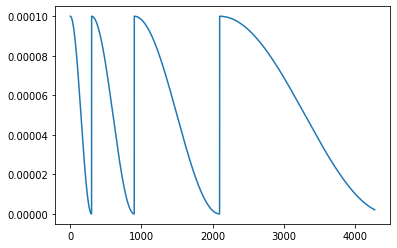

In [ ]:
x = [i for i in range(STEPS)]
y = [schedule(s) for s in range(STEPS)]
plt.plot(x, y)

> Warning: There is a gap between what I had expected and the acutal `LearningRateScheduler` that tensorflow gives us. The `LearningRateScheduler` update the lr `on_epoch_begin` while it makes more sense to do it `on_batch_end` or `on_batch_begin`.

## Callbacks

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='001_best_model.h5',
        monitor='val_loss',
        save_best_only=True),
    ]

model.compile(loss="sparse_categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(schedule),
              metrics=["accuracy"])

## Training

In [ ]:
if TRAIN:
    history = model.fit(train_ds_batch,
                        epochs = EPOCHS,
                        validation_data=valid_ds_batch,
                        callbacks=callbacks)

Epoch 1/8
12/54 [=====>........................] - ETA: 21:15 - loss: 0.4106 - accuracy: 0.8684

## Evaluating


In [ ]:
def plot_hist(hist):
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Loss over epochs')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'valid'], loc='best')
    plt.show()

In [ ]:
if TRAIN:
    plot_hist(history)

We load the best weight that were kept from the training phase. Just to check how our model is performing, we will attempt predictions over the validation set. This can help to highlight any classes that will be consistently miscategorised.

In [ ]:
model.load_weights('001_best_model.h5')

## Prediction

In [ ]:
x = train_df.sample(1).filename.values[0]
img = decode_image(x)

CPU times: user 57.3 ms, sys: 870 µs, total: 58.2 ms
Wall time: 62.1 ms


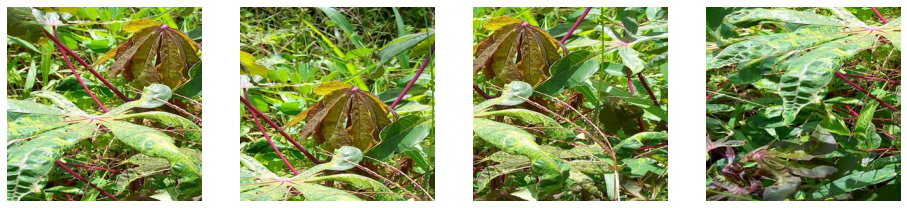

In [ ]:
%%time
imgs = [tf.image.random_crop(img, size=[*IMG_SIZE, 3]) for _ in range(4)]

_,axs = plt.subplots(1,4,figsize=(16,4))
for (x, ax) in zip(imgs, axs.flatten()):
    ax.imshow(x.numpy().astype(np.uint8))
    ax.axis('off')

I apply some very basic test time augmentation to every local image extracted from the original 600-by-800 images. We know we can do some fancy augmentation with `albumentations` but I wanted to do that exclusively with Keras preprocessing layers to keep the cleanest pipeline possible.

In [ ]:
tta = tf.keras.Sequential(
    [
        tf.keras.layers.experimental.preprocessing.RandomCrop((*IMG_SIZE)),
        tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
        tf.keras.layers.experimental.preprocessing.RandomZoom((-0.2, 0.2)),
        tf.keras.layers.experimental.preprocessing.RandomContrast((0.2,0.2))
    ]
)

In [ ]:
def predict_tta(filename, num_tta=4):
    img = decode_image(filename)
    img = tf.expand_dims(img, 0)
    imgs = tf.concat([tta(img) for _ in range(num_tta)], 0)
    preds = model.predict(imgs)
    return preds.sum(0).argmax()

In [ ]:
pred = predict_tta(df.sample(1).filename.values[0])
print(pred)

3


In [ ]:
if INFERENCE:
    from tqdm import tqdm
    preds = []
    with tqdm(total=len(valid_df)) as pbar:
        for filename in valid_df.filename:
            pbar.update()
            preds.append(predict_tta(filename, num_tta=4))

100%|██████████| 4280/4280 [25:34<00:00,  2.79it/s]


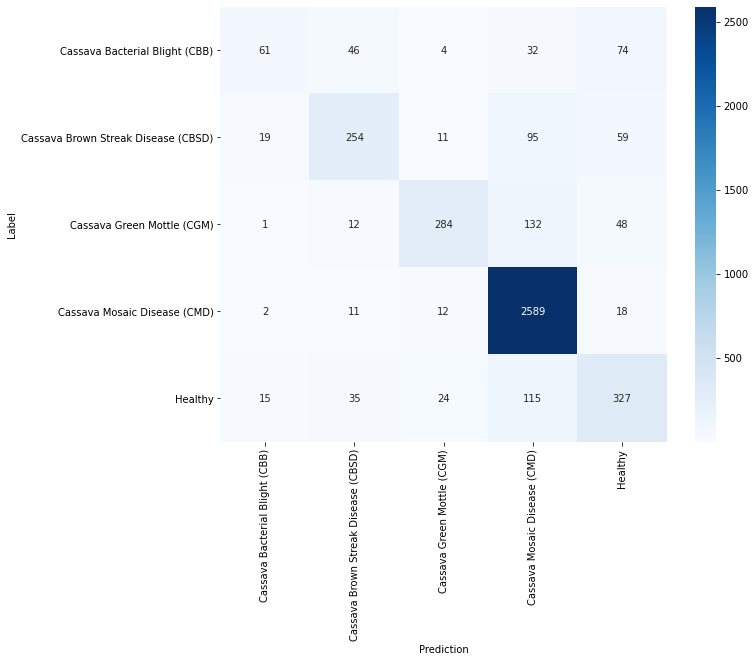

In [ ]:
if INFERENCE:
    cm = tf.math.confusion_matrix(valid_df.label.values, np.array(preds))
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm,
                xticklabels=id2label.values(),
                yticklabels=id2label.values(), 
                annot=True,
                fmt='g',
                cmap="Blues")
    plt.xlabel('Prediction')
    plt.ylabel('Label')
    plt.show()

In [ ]:
test_folder = input_path + '/test_images/'
submission_df = pd.DataFrame(columns={"image_id","label"})
submission_df["image_id"] = os.listdir(test_folder)
submission_df["label"] = 0

In [ ]:
submission_df['label'] = (submission_df['image_id']
                            .map(lambda x : predict_tta(test_folder+x)))

In [ ]:
submission_df

,image_id,label
0,2216849948.jpg,4


In [ ]:
submission_df.to_csv("submission.csv", index=False)